In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os
import datetime
from datetime import datetime
from utils import helper as hp
from utils.config_util import Config
from PIL import ImageFile
import ipywidgets as widgets
from IPython.display import display
from PIL import Image
ImageFile.LOAD_TRUNCATED_IMAGES = True

In [2]:
all_athletes = pd.read_csv('csvs/athlete_athletes_comlete.csv')
alternate_atheletes = pd.read_csv('csvs/alternate_athlete_athletes_comlete.csv')
na_athlete = pd.read_csv('csvs/na_athlete_athletes_comlete.csv')

now = datetime.now()

all_athletes['dob'] = pd.to_datetime(all_athletes['dob'])
all_athletes['age'] = all_athletes['dob'].apply(lambda x: now.year - x.year - ((now.month, now.day) < (x.month, x.day)))
all_athletes['month'] = all_athletes['dob'].dt.month
all_athletes['month'] = all_athletes['month'].apply(hp.month_number_to_month_name)
all_athletes['code'] = all_athletes['code'].astype(str)
all_athletes['age'] = all_athletes['age'].astype(int)

merged_all = pd.concat([all_athletes, alternate_atheletes, na_athlete])
merged_all['dob'] = pd.to_datetime(merged_all['dob'], errors='coerce')
merged_all['age'] = merged_all['dob'].apply(lambda x: now.year - x.year - ((now.month, now.day) < (x.month, x.day)))
merged_all['month'] = merged_all['dob'].dt.month
merged_all['month'] = merged_all['month'].apply(hp.month_number_to_month_name)
merged_all['code'] = merged_all['code'].astype(str)
merged_all['age'] = merged_all['age'].astype(int, errors='ignore')

code_2_disciplines = pd.read_csv('csvs/athletes_disciplines_complete.csv', dtype={'code': str})
athletes_disciplines = pd.merge(all_athletes, code_2_disciplines, on='code')
athletes_disciplines.to_csv('csvs/everything.csv', index=False)



In [3]:
full_nocs = pd.read_csv('csvs/noc.csv')
full_nocs_lst = full_nocs['noc_name'].unique().tolist()

full_disciplines_lst = code_2_disciplines['discipline_desc'].unique().tolist()

## How many athletes are there in the dataset?

In [4]:
len(all_athletes)

10929

## How many men and women are there

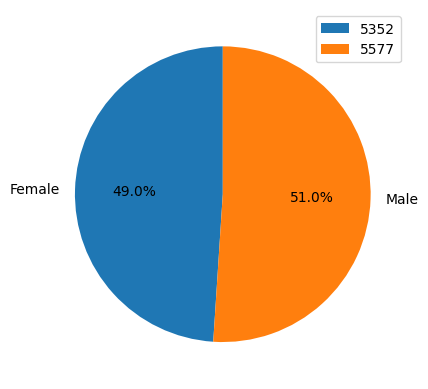

In [5]:
all_athletes.groupby('gender').code.count().plot(kind='pie', autopct='%1.1f%%', startangle=90, shadow=False)
plt.legend(all_athletes.groupby('gender').code.count())
plt.ylabel('')
plt.show()

## How many people born in each month

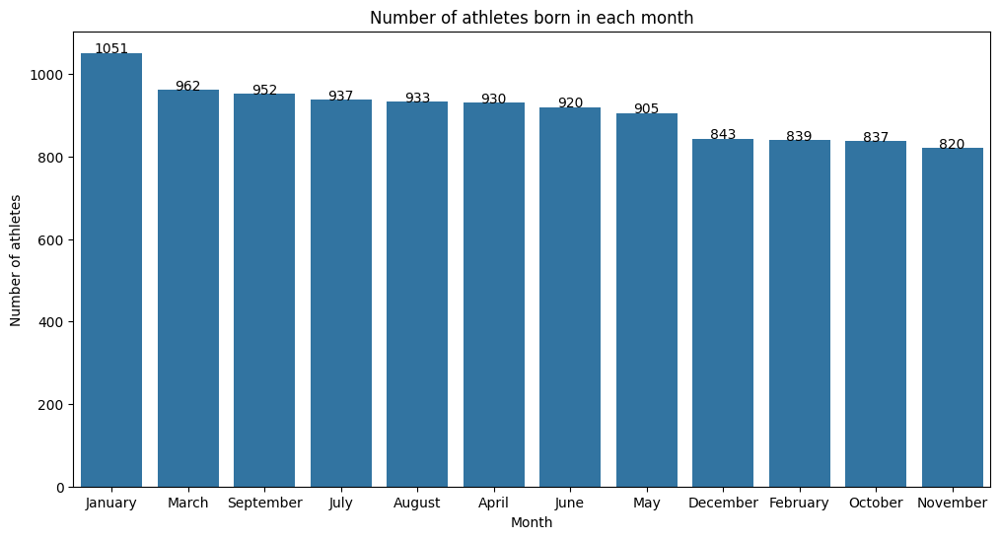

In [6]:
plt.figure(figsize=(12, 6))
sns.barplot(x=all_athletes['month'].value_counts().index, y=all_athletes['month'].value_counts().values)
for i in range(len(all_athletes['month'].value_counts().values)):
    plt.text(i, all_athletes['month'].value_counts().values[i], all_athletes['month'].value_counts().values[i], ha = 'center')
    
plt.title('Number of athletes born in each month')
plt.ylabel('Number of athletes')
plt.xlabel('Month')
plt.show()


# Most Senior and Junior athletes

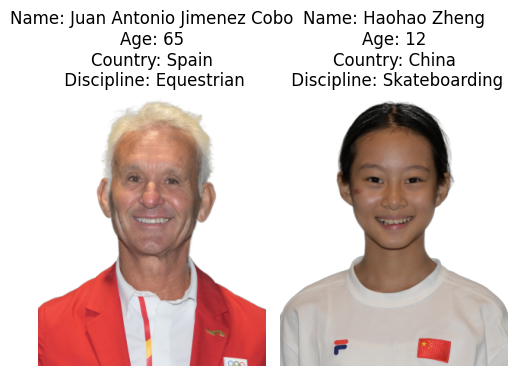

In [7]:
senior = all_athletes['dob'].idxmin()
junior = all_athletes['dob'].idxmax()
needed_columns = ['code', 'given_name', 'family_name', 'noc_full', 'dob', 'age', 'picture_url', 'detail_url']
G = pd.concat([all_athletes.loc[senior], all_athletes.loc[junior]], axis=1).T.copy().reset_index(drop=True)
G = G[needed_columns]


fig, axes = plt.subplots(1, 2, figsize=(5, 5))

for i in range(2):
    row = G.loc[i]
    disciplines = code_2_disciplines[code_2_disciplines['code'] == G.loc[i, 'code']]['discipline_desc'].values
    axes[i].axis('off')
    axes[i].imshow(hp.fetch_image(row['picture_url'], row['code']))
    axes[i].set_title(f"Name: {row['given_name']} {row['family_name']}\nAge: {row['age']}\nCountry: {row['noc_full']}\n Discipline: {disciplines[0]}")

plt.tight_layout()
plt.show()


## Thai Athletes Overview

In [8]:
def show_all_athletes(country='Thailand', discipline_option='all', col=10):
    athletes = all_athletes[all_athletes['noc_full'] == country.capitalize()]
    athletes = athletes.sort_values('age')
    
    tables = list(athletes[needed_columns].iterrows())
    filtered_tables = []
    for i in range(len(tables)):
        index, profile = tables[i]
        code = profile['code']
        discipline = code_2_disciplines[code_2_disciplines['code'] == code]['discipline_desc'].values[0]
        if discipline_option == discipline or discipline_option == 'all':
            filtered_tables.append([discipline, tables[i]])

    print('count of athletes:', len(tables))
    print('filted_count:', len(filtered_tables))
    # print(filtered_tables)
    i_ = 0
    num_rows = (len(filtered_tables) // col) + 1
    print(num_rows)
    
    for row in range(num_rows):
        # print('Building row:', row)
        fig, axes = plt.subplots(1, col, figsize=(50, 50))
        for c in range(col):
            if i_ >= len(filtered_tables):
                fig.delaxes(axes[c])
            else:
                disci, series = filtered_tables[i_]
                index, profile = series
                code, given_name, family_name, noc_full, dob, age, picture_url, detail_url = profile
                axes[c].axis('off')
                image = hp.fetch_image(picture_url, code)
                axes[c].imshow(image)
                axes[c].set_title(f"{given_name}\n{family_name.upper()}\n({age})\n{disci}\n\n", fontsize=30)
            i_ += 1


noc_dropdown = widgets.Dropdown(
    options=full_nocs_lst,
    value='Thailand',
    description='Country:' ,
    disabled=False,
    
)

discipline_dropdown = widgets.Dropdown(
    options=full_disciplines_lst + ['all'],
    value='all',
    description='Discipline:',
    disabled=False,
)

display(noc_dropdown)
display(discipline_dropdown)

Dropdown(description='Country:', index=181, options=('Afghanistan', 'Albania', 'Algeria', 'American Samoa', 'A…

Dropdown(description='Discipline:', index=45, options=('Wrestling', 'Athletics', 'Judo', 'Triathlon', 'Swimmin…

count of athletes: 51
filted_count: 51
6
1898237  is being refetched
refetching image 1898237


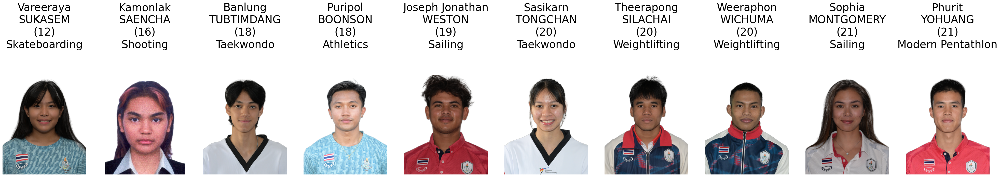

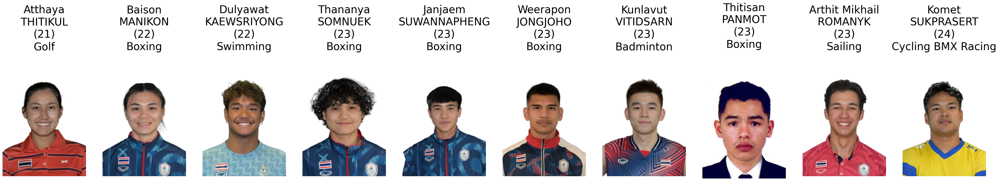

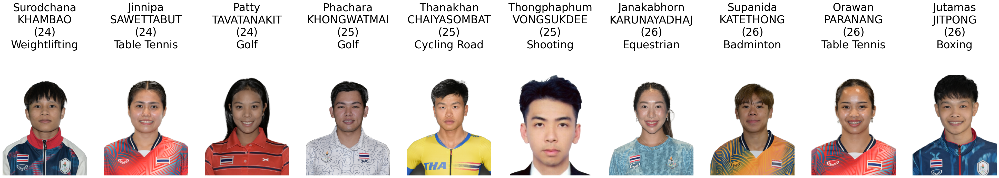

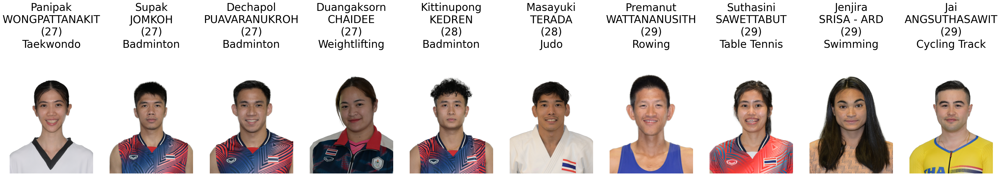

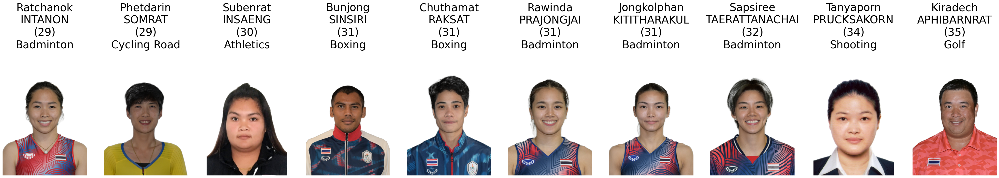

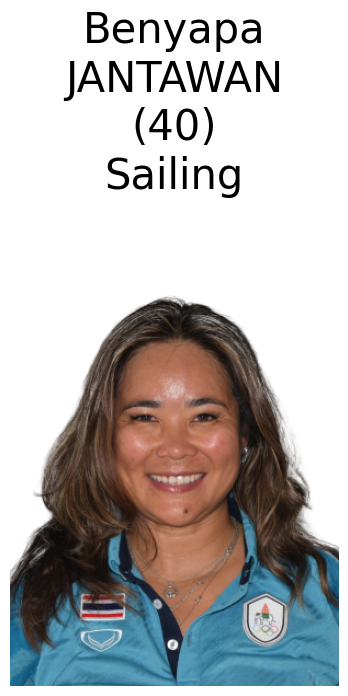

In [9]:
show_all_athletes(country=noc_dropdown.value, discipline_option=discipline_dropdown.value)

## Check Medals Won by Country

In [10]:
config = Config('configs/url_config.yaml')
URLS_CONFIG = config.config['URLS']
class WinnerInfo:
    def __init__(self, winner_obj):
        self.code = winner_obj['competitorCode']
        self.medalType = winner_obj['medalType']

    def __str__(self):
        return f"{self.code} - {self.medalType}"
    
    def __repr__(self):
        return f"{self.code} - {self.medalType}"


class Organization:

    def __init__(self, table, config):
        
        self.config = config
        self.country_code = table['organisation']
        self.country_name = hp.get_full_name_from_short_code(self.country_code)
        self.rank = table['rank']

        self.disciplines = dict()
        self.winners = dict()
        
        self._process_all(table)
    
    def __str__(self):
        return f"{self.country_name} ({self.country_code}), Rank: {self.rank},  Total Medals: {self.total_medals['Total']['total']}"

    def __repr__(self):
        return f"{self.country_name} ({self.country_code}), Rank: {self.rank},  Total Medals: {self.total_medals['Total']['total']}"
        
    def _process_all(self, table):
        self._process_discipline_to_medals(table['disciplines'])
        self._process_total_medals(table['medalsNumber'])
        self._process_winners(table['disciplines'])
    
    def _build_winners_lst(self):
        l = [w for disc in self.winners.values() for w in disc]
        self.winners_lst = l

        


    def _process_winners(self, disciplines_lst):
        _winner_dict = dict()
        for disc in disciplines_lst:
            disciplineC = disc['code']
            _winner_dict[disciplineC] = _winner_dict[disciplineC] if disciplineC in _winner_dict.keys() else []
            for winner_obj in disc['medalWinners']:
                if winner_obj['competitorType'] == 'A':
                    w = WinnerInfo(winner_obj)
                    _winner_dict[disciplineC].append(w)
                else:
                    expanded_team_lst = hp.get_team_members(self.config, winner_obj)
                    for team_member in expanded_team_lst:
                        w = WinnerInfo(team_member)
                        _winner_dict[disciplineC].append(w)
        self.winners = _winner_dict
        self._build_winners_lst()

    def _process_discipline_to_medals(self, discipline_lst):
        _discipline_to_medals = dict()
        for disc in discipline_lst:
            _discipline_to_medals[disc['code']] = {k: disc[k] for k in ['gold', 'silver', 'bronze']}
        self.disciplines_to_medals = _discipline_to_medals

    def _process_total_medals(self, medals):
        _total_medals = dict()
        for medal in medals:
            _total_medals[medal['type']] = {k: medal[k] for k in ['gold', 'silver', 'bronze', 'total']}
        # print(_total_medals)
        self.total_medals = _total_medals


In [11]:
countries_won, medal_tables = hp.countries_won_medals(URLS_CONFIG)
data_medals_lst = []
for table in medal_tables:    
    o = hp.Organization(table, URLS_CONFIG) 
    data_medals_lst.append(o)
    

In [12]:
all_countries_won = [( c.country_name, c.country_code) for c in data_medals_lst]
all_countries_won = sorted(all_countries_won, key=lambda x: x[0])
Country_Dropdown = widgets.Dropdown(
    options=all_countries_won,
    value='THA',
    description='Country:' ,
    disabled=False,
)

display(Country_Dropdown)




Dropdown(description='Country:', index=83, options=(('Albania', 'ALB'), ('Algeria', 'ALG'), ('Argentina', 'ARG…

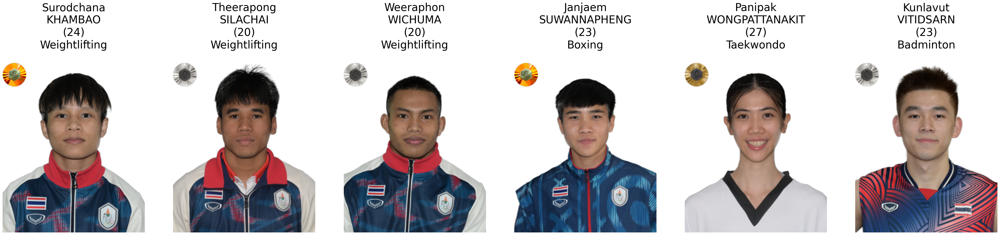

In [13]:



selected_country = [d for d in data_medals_lst if d.country_code == Country_Dropdown.value][0]
winners = selected_country.winners
needed_columns = ['mainfunc_desc', 'code', 'given_name', 'family_name', 'noc_full', 'dob', 'age', 'picture_url', 'detail_url']
medal_images = hp.load_medal_images()
num_athletes = sum([len(winners[x]) for x in winners.keys()])
col_num = 6
num_rows = num_athletes//col_num if num_athletes%col_num == 0 else num_athletes//col_num + 1

def get_relevent_athletes(lst_code, winners_list):
    
    medal_list_df = pd.DataFrame([(c.code, c.medalType) for c in winners_list], columns=['code', 'medalType'])
    subset_df = merged_all[merged_all['code'].isin(lst_code)] [needed_columns]
    merge = pd.merge(subset_df, code_2_disciplines, on='code')
    merge = merge.drop_duplicates(subset=['code'], keep='first')
    medal_list_df['medalType'] = medal_list_df['medalType'].apply(lambda x: x.split('_')[1].lower())
    merge['age'] = merge['age'].astype(int, errors='ignore')
    return merge, medal_list_df
winners_list = selected_country.winners_lst
codes = pd.Series([c.code for c in winners_list]).unique()
final_to_show, medal_list_df  = get_relevent_athletes(codes, selected_country.winners_lst)
for row in range(num_rows):
        df_slice = final_to_show.iloc[row*col_num: (row+1)*col_num]
        df_slice = df_slice.reset_index(drop=True)
        if df_slice.empty:
            break
        fig, axes = plt.subplots(1, col_num, figsize=(50, 50))
        col_ = 0
        for index, data in df_slice.iterrows():
            mainfunc_desc, code, given_name, family_name, noc_full, dob, age, picture_url, detail_url, discipline_code, discipline_desc= data            
            alternate_flag = False
            if mainfunc_desc.strip().lower() == 'alternate_flag':
                alternate_flag = True

            image = hp.fetch_image(data['picture_url'], code)
            
            move_right = 0
            move_down = 0
            
            
            
            medal_c = 1
            medal_of_this_athlete = medal_list_df[medal_list_df['code'] == code]
            for index, medal in medal_of_this_athlete.iterrows():
                _, medalType = medal
                # there is no more room for medals in the image, move down and reset move_right
                if medal_c > 4:
                    print('nore more room')
                    move_right = 0
                    move_down += 60
                
                # discipline, medal = medals_for_this_code.values()
                # disciplines_set.add(discipline)
                image = hp.add_medal(image, medal_images[medalType], (move_right, move_down))
                move_right += 60
                medal_c += 1
            axes[col_].axis('off')
            axes[col_].imshow(image)
            axes[col_].set_title(f"{given_name}\n{family_name.upper()}\n({age})\n{discipline_desc}\n{'alternate' if alternate_flag else ''}", fontsize=30)
            col_ += 1
        # if the row is not full, delete the axes that are not used
        if col_ < col_num:
            for i in range(col_, col_num):    
                fig.delaxes(axes[i])
            fig.set_size_inches(50, 50*(col_)/col_num)

## Atheletes who won the highest number of medals

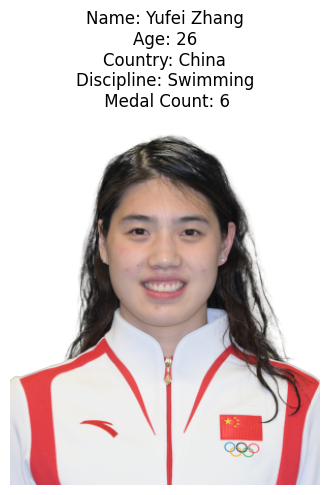

In [14]:
countries, medal_tables =  hp.countries_won_medals(URLS_CONFIG)
tally = []
for i in medal_tables:
    a = i['disciplines']
    for j in a:
        m = j['medalWinners']
        for l in m:
            r = dict()
            r['medalType'] = l['medalType']
            r['competitorCode'] = l['competitorCode']
            r['competitorType'] = l['competitorType']
            tally.append(r)

    
new_tally = []
for i in tally:
    if i['competitorType'] == 'A':
        new_tally.append(i)
    else:
        new_tally.extend(hp.get_team_members(URLS_CONFIG, i))
medalist_df = pd.DataFrame(new_tally, columns=[ 'competitorCode', 'medalType'])
f = medalist_df.groupby('competitorCode')['medalType'].count().sort_values(ascending=False)
code = f.index[0]
medal_count = f.values[0]
hp.search_and_show(code, [merged_all], code_2_disciplines, medal_count)


## Atheletes born in September 1995

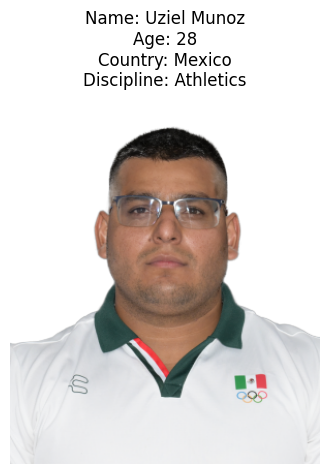

In [15]:
# any athelete born in 1995 September?

sep_1995 = all_athletes[(all_athletes['dob'].dt.year == 1995) & (all_athletes['dob'].dt.month == 9)]
sep_1995_male = sep_1995[sep_1995['gender'] == 'Male']
for row in sep_1995_male.iterrows():
    code = row[1]['code']
    hp.search_and_show(code, [all_athletes], code_2_disciplines)
    # to see all the athletes born in 1995 September, uncomment the line below
    break



## Athletes both in March 1997

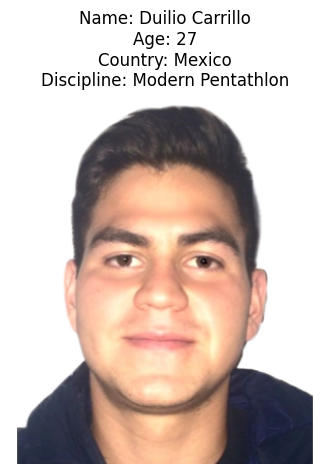

In [16]:
# any athelete born in 1997 March?

march_1997 = all_athletes[(all_athletes['dob'].dt.year == 1997) & (all_athletes['dob'].dt.month == 3)]
march_1997_male = march_1997[march_1997['gender'] == 'Male']
for row in march_1997_male.iterrows():
    code = row[1]['code']
    
    hp.search_and_show(code, [all_athletes], code_2_disciplines)
    # to see all the athletes born in 1997 March, just remove the break statement
    break
    

## Most senior and junior athletes in each disciplines

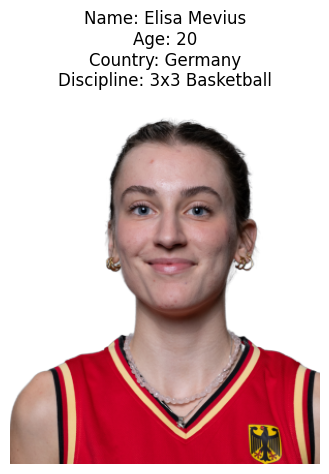

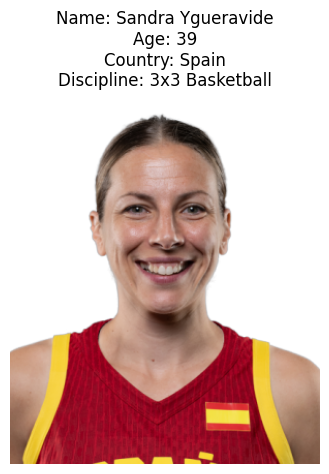

In [17]:
# oldest and youngest for each sport
rs = athletes_disciplines.groupby('discipline_desc').age.agg(['idxmin', 'idxmax'])
for i in rs.iterrows():
    discipline = i[0]
    # if discipline == 'Table Tennis':
    youngest = i[1]['idxmin']
    youngest_code = athletes_disciplines.loc[youngest]['code']
    oldest = i[1]['idxmax']
    oldest_code = athletes_disciplines.loc[oldest]['code']
    hp.search_and_show(youngest_code, [athletes_disciplines], code_2_disciplines)
    hp.search_and_show(oldest_code, [athletes_disciplines], code_2_disciplines)
    # to see all athletes in the discipline, uncomment the line below
    break

## Age Distribution Across All Athletes

<Axes: xlabel='age', ylabel='Count'>

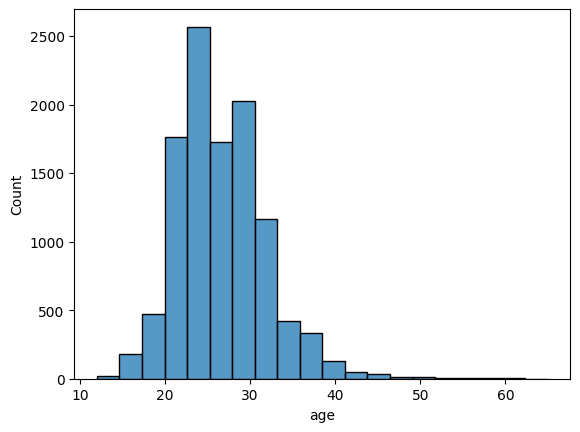

In [18]:
sns.histplot(all_athletes['age'], bins=20)

<Axes: ylabel='age'>

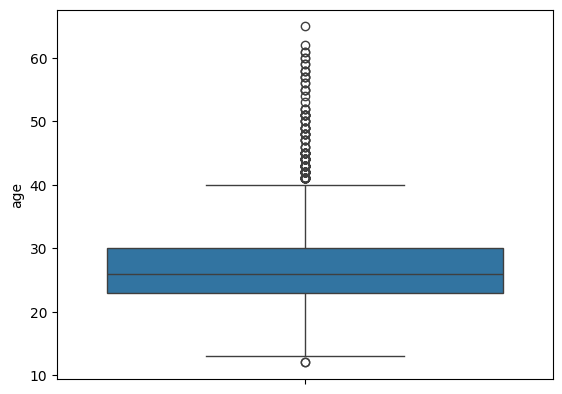

In [19]:
sns.boxplot(all_athletes['age'])

## Age Distribution across each discipline

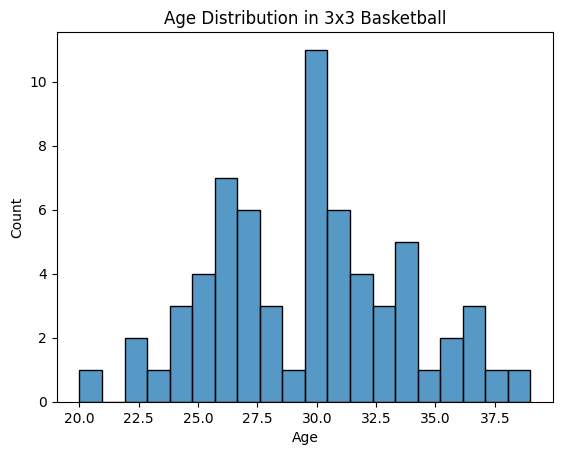

In [20]:
ages_by_discipline = athletes_disciplines.groupby('discipline_desc')['age'].apply(list)

for discipline, ages in ages_by_discipline.items():
    plt.figure()
    sns.histplot(ages, bins=20)
    plt.title(f"Age Distribution in {discipline}")
    plt.xlabel("Age")
    plt.ylabel("Count")
    plt.show()
    break

## Are there correlation between medals and age

In [22]:
countries, medal_tables =  hp.countries_won_medals(URLS_CONFIG)
tally = []
for i in medal_tables:
    a = i['disciplines']
    for j in a:
        m = j['medalWinners']
        for l in m:
            r = dict()
            r['medalType'] = l['medalType']
            r['competitorCode'] = l['competitorCode']
            r['competitorType'] = l['competitorType']
            tally.append(r)

    
new_tally = []
for i in tally:
    if i['competitorType'] == 'A':
        new_tally.append(i)
    else:
        new_tally.extend(hp.get_team_members(URLS_CONFIG, i))
medalist_df = pd.DataFrame(new_tally, columns=[ 'competitorCode', 'medalType'])


final_df = pd.merge(medalist_df, merged_all, left_on='competitorCode', right_on='code')
final_df['competitorCode'] = final_df['competitorCode'].astype(str)
final_df['medalType'] = final_df['medalType'].apply(lambda x: x.split('_')[1].capitalize())
final_df['age'] = final_df['age'].astype(int)

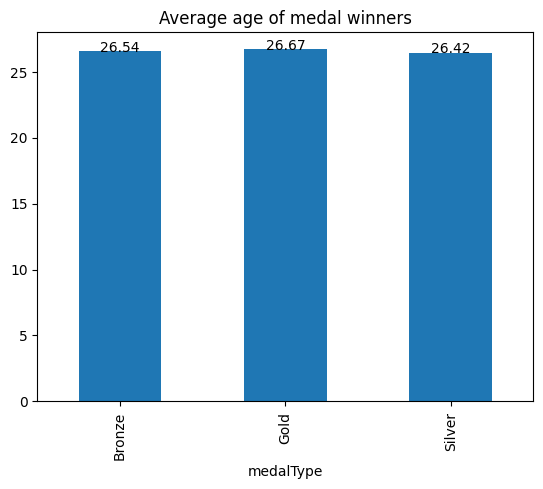

In [23]:
g = final_df.groupby('medalType').age.mean()
g.plot(kind='bar')
plt.title('Average age of medal winners')
for i in range(len(g)):
    plt.text(i, g.values[i], round(g.values[i], 2), ha = 'center')

## Age Heatmap Analysis

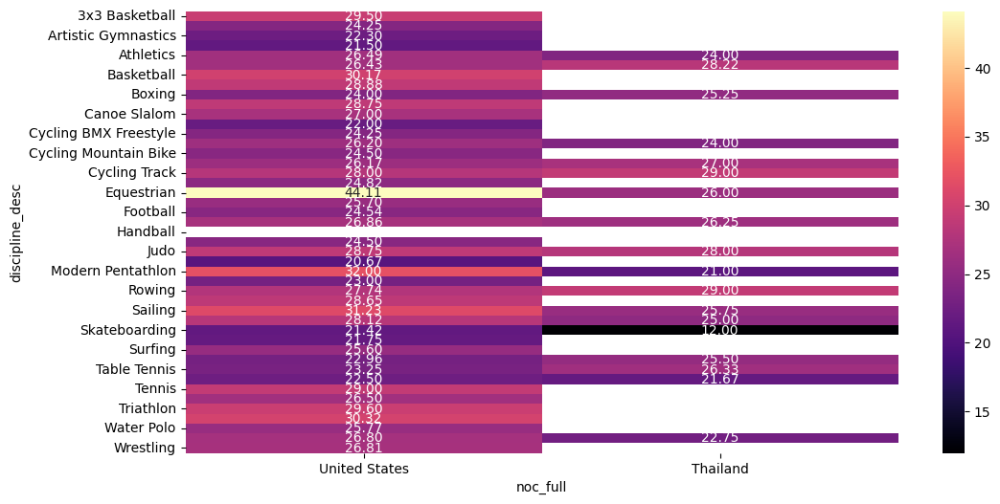

In [24]:
# heatmap of average age of all athletes by discipline and country

plt.figure(figsize=(12, 6))
stack_df = athletes_disciplines.groupby(['discipline_desc', 'noc_full']).age.mean().unstack()
# print(list(stack_df.columns))
stack_df = stack_df[['United States', 'Thailand']]
sns.heatmap(stack_df, cmap='magma', annot=True, fmt=".2f")
plt.show()

# Height Analysis

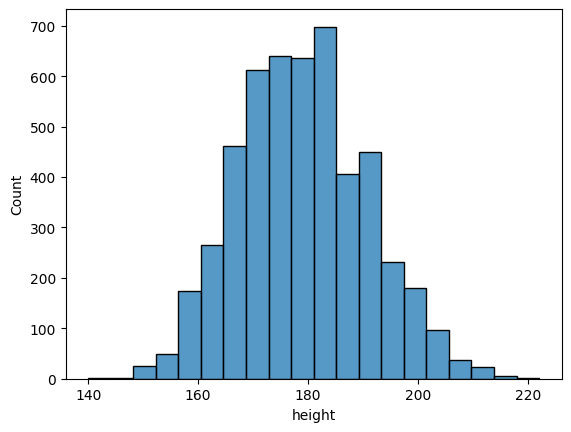

In [25]:
# height distribution of all athletes, 0 is not included
height_not_0_df = all_athletes[all_athletes['height'] != 0]['height']
sns.histplot(height_not_0_df, bins=20)
plt.show()

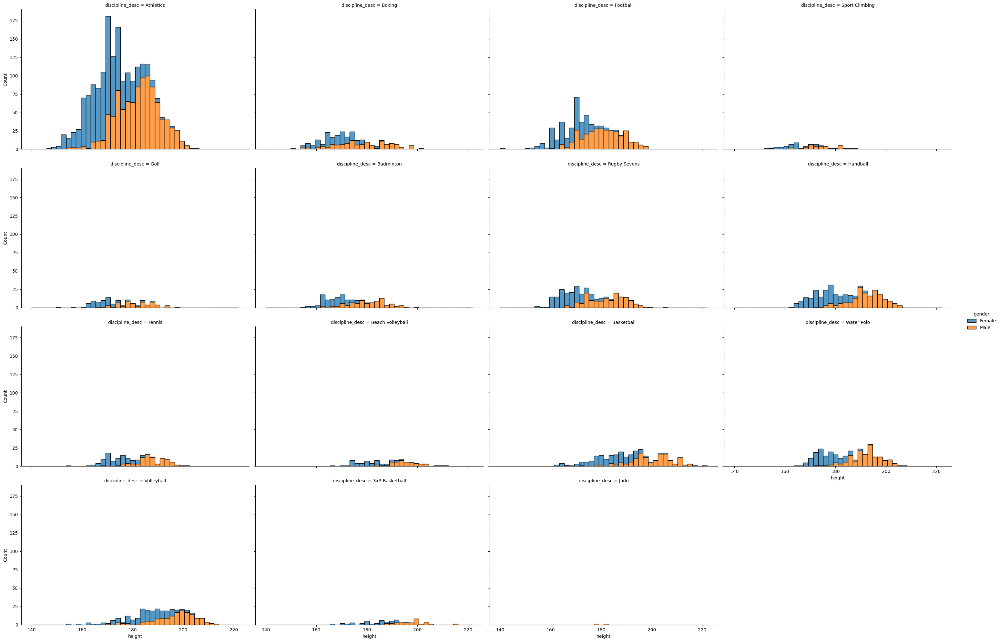

In [26]:

# Filter out rows where height is 0
athletes_disciplines_height_not_0 = athletes_disciplines[athletes_disciplines['height'] != 0]



sns.displot(data=athletes_disciplines_height_not_0, kind='hist', x="height", col="discipline_desc", hue="gender",
            col_wrap=4, aspect=1.5, multiple="stack", legend=True)

plt.savefig('images/height_distribution.png')